# NFL - Player Contact Detection Challenge

<img src="https://www.googleapis.com/download/storage/v1/b/kaggle-user-content/o/inbox%2F644036%2F65cd663d2c823043b36ecda6c93c1304%2Fcontact-example.gif?generation=1670265252697886&alt=media" style="display:block; margin: 20px auto;">


In this competition, you are tasked with predicting moments of contact between player pairs, as well as when players make non-foot contact with the ground using game footage and tracking data. Each play has four associated videos. Two videos, showing a sideline and endzone view, are time synced and aligned with each other. Additionally, an All29 view is provided but not guaranteed to be time synced. The training set videos are in **train/** with corresponding labels in **train_labels.csv**, while the videos for which you must predict are in the **test/** folder.

This year we are also providing baseline helmet detection and assignment boxes for the training and test set. **train_baseline_helmets.csv** is the output from last year's winning player assignment model.

**train_player_tracking.csv** provides 10 Hz tracking data for each player on the field during the provided plays.

**train_video_metadata.csv** contains timestamps associated with each Sideline and Endzone view for syncing with the player tracking data.

This is a code competition. When you submit, your model will be rerun on a set of 61 unseen plays located in a holdout test set. The publicly provided test videos are simply a set of mock plays (copied from the training set) which are not used in scoring.

The associated **test_baseline_helmets.csv**, **test_player_tracking.csv**, and **test_video_metadata.csv** are available to your model when submitting.

A **sample_submission.csv** will be available when submitting and will contain all rows required for a valid submission.


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pylab as plt

from sklearn.metrics import matthews_corrcoef

# Read in data files
BASE_DIR = "."

# Labels and sample submission
labels = pd.read_csv(f"{BASE_DIR}/train_labels.csv", parse_dates=["datetime"])

ss = pd.read_csv(f"{BASE_DIR}/sample_submission.csv")

# Player tracking data
tr_tracking = pd.read_csv(
    f"{BASE_DIR}/train_player_tracking.csv", parse_dates=["datetime"]
)
te_tracking = pd.read_csv(
    f"{BASE_DIR}/test_player_tracking.csv", parse_dates=["datetime"]
)

# Baseline helmet detection labels
tr_helmets = pd.read_csv(f"{BASE_DIR}/train_baseline_helmets.csv")
te_helmets = pd.read_csv(f"{BASE_DIR}/test_baseline_helmets.csv")

# Video metadata with start/stop timestamps
tr_video_metadata = pd.read_csv(
    "./train_video_metadata.csv",
    parse_dates=["start_time", "end_time", "snap_time"],
)


# What is the goal of this competition?
Simply put, we are trying to predict all moments of contact that occurs for each 0.1 second within a football play. Contact can occur in two ways:
- Between two players.
- Between a player and the ground. **Note: A player is considered in contact with the ground when he touches the ground with anything other than his hands or his feet.**

Submissions should contain predictions for all possible combination of the 22 players, and each player with the ground for each timestep within the play. Only one row is required for each predicted pair, with the lower player's `nfl_player_id` as `nfl_player_id_1`  and the larger as `nfl_player_id_2`.

# What Data are Provided?

For the full data details, please review the data description page.

*Note: This is a code competition. When you submit, your model will be rerun on a set of 60 unseen plays located in a holdout test set. The publicly provided test videos are simply a set of mock plays (copied from the training set) which are not used in scoring.*

# Video and Baseline Boxes
As noted above, the provided baseline boxes are imperfect but allow you to quickly tackle the problem without having to address the helmet detection. The below video shows an example of these baseline predictions alongside the true helmet labels.

In [53]:
import os
import cv2
import subprocess
from IPython.display import Video, display
import pandas as pd
import time


def video_with_helmets(
    video_path: str, baseline_boxes: pd.DataFrame, verbose=True) -> str:
    """
    Annotates a video with baseline model boxes and labels.
    """
    VIDEO_CODEC = "mp4v"
    HELMET_COLOR = (0, 0, 0)  # Black
    
    video_name = os.path.basename(video_path)
    if verbose:
        print(f"Running for {video_name}")
    baseline_boxes = baseline_boxes.copy()

    vidcap = cv2.VideoCapture(video_path)
    fps = vidcap.get(cv2.CAP_PROP_FPS)
    width = int(vidcap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(vidcap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    output_path = "./train/labeled_" + video_name
    tmp_output_path = "./train/tmp_" + video_name
    output_video = cv2.VideoWriter(
        tmp_output_path, cv2.VideoWriter_fourcc(*VIDEO_CODEC), fps, (width, height)
    )

    frame = 0
    while True:
        it_worked, img = vidcap.read()
        if not it_worked:
            break
        # We need to add 1 to the frame count to match the label frame index
        # that starts at 1
        frame += 1

        # Let's add a frame index to the video so we can track where we are
        img_name = video_name.replace(".mp4", "")
        cv2.putText(
            img,
            img_name,
            (10, 30),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            HELMET_COLOR,
            thickness=1,
        )

        cv2.putText(
            img,
            str(frame),
            (1280 - 90, 720 - 20),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            HELMET_COLOR,
            thickness=1,
        )

        # Now, add the boxes
        boxes = baseline_boxes.query("video == @video_name and frame == @frame")
        for box in boxes.itertuples(index=False):
            cv2.rectangle(
                img,
                (box.left, box.top),
                (box.left + box.width, box.top + box.height),
                HELMET_COLOR,
                thickness=1,
            )
            cv2.putText(
                img,
                box.player_label,
                (box.left + 1, max(0, box.top - 20)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.5,
                HELMET_COLOR,
                thickness=1,
            )

        output_video.write(img)
    output_video.release()
    
    if verbose:
        print(f"{tmp_output_path} released")
    
    # Add short delay to allow release to finalize file
    time.sleep(2)
    
    # Not all browsers support the codec, we will re-load the file at tmp_output_path
    # and convert to a codec that is more broadly readable using ffmpeg
    if os.path.exists(output_path):
        os.remove(output_path)
        
    subprocess.run(
        [
            "ffmpeg",
            "-i",
            tmp_output_path,
            "-crf",
            "18",
            "-preset",
            "veryfast",
            "-hide_banner",
            "-loglevel",
            "error",
            "-vcodec",
            "libx264",
            output_path
        ], stdout=subprocess.PIPE, stderr=subprocess.STDOUT
    )
        
    os.remove(tmp_output_path)
    
    # print(p)
    
    return output_path


This video displays these helmet boxes on an example play. They are provided starting a few frames prior to the play starting and the video displays the associated player label (home/visiting team in combination with jersey number) next to the helmet box.

In [54]:
example_video = "./train/58168_003392_Sideline.mp4"
output_video = video_with_helmets(example_video, tr_helmets)

Running for 58168_003392_Sideline.mp4
./train/tmp_58168_003392_Sideline.mp4 released
CompletedProcess(args=['ffmpeg', '-i', './train/tmp_58168_003392_Sideline.mp4', '-crf', '18', '-preset', 'veryfast', '-hide_banner', '-loglevel', 'error', '-vcodec', 'libx264', './train/labeled_58168_003392_Sideline.mp4'], returncode=0, stdout=b'')


In [55]:
frac = 0.65  # scaling factor for display
display(
    Video(data=output_video, embed=True, height=int(720 * frac), width=int(1280 * frac))
)

# NGS Tracking Data
The use of the NGS tracking data will be important for correctly labeling videos. Some things to note are:

- NGS data is sampled at a rate of 10Hz, while videos are sampled at roughly 59.94Hz.
- The tracking data can be approximately synced with video using the training metadata.
- NGS data contains a `step` column which can we used to combine with the labels and sample submission file.
- Features including speed, acceleration, orientation are included. For a full list refer to the data description page.


In [56]:
import matplotlib.patches as patches
import matplotlib.pylab as plt

def create_football_field(
    linenumbers=True,
    endzones=True,
    figsize=(12, 6.33),
    line_color="black",
    field_color="white",
    ez_color=None,
    ax=None,
    return_fig=False,
):
    """
    Function that plots the football field for viewing plays.
    Allows for showing or hiding endzones.
    """

    if ez_color is None:
        ez_color = field_color

    rect = patches.Rectangle(
        (0, 0),
        120,
        53.3,
        linewidth=0.1,
        edgecolor="r",
        facecolor=field_color,
        zorder=0,
    )

    if ax is None:
        fig, ax = plt.subplots(1, figsize=figsize)
    ax.add_patch(rect)
    ax.plot([10, 10, 10, 20, 20, 30, 30, 40, 40, 50, 50, 60, 60, 70, 70, 80,
              80, 90, 90, 100, 100, 110, 110, 120, 0, 0, 120, 120],
             [0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3,
              53.3, 0, 0, 53.3, 53.3, 0, 0, 53.3, 53.3, 53.3, 0, 0, 53.3],
             color=line_color)
    
    # Endzones
    if endzones:
        ez1 = patches.Rectangle(
            (0, 0),
            10,
            53.3,
            linewidth=0.1,
            edgecolor=line_color,
            facecolor=ez_color,
            alpha=0.6,
            zorder=0,
        )
        ez2 = patches.Rectangle(
            (110, 0),
            10,
            53.3,
            linewidth=0.1,
            edgecolor=line_color,
            facecolor=ez_color,
            alpha=0.6,
            zorder=0,
        )
        ax.add_patch(ez1)
        ax.add_patch(ez2)

    ax.axis("off")
    if linenumbers:
        for x in range(20, 110, 10):
            numb = x
            if x > 50:
                numb = 120 - x
            ax.text(
                x,
                5,
                str(numb - 10),
                horizontalalignment="center",
                fontsize=20,  # fontname='Arial',
                color=line_color,
            )
            ax.text(
                x - 0.95,
                53.3 - 5,
                str(numb - 10),
                horizontalalignment="center",
                fontsize=20,  # fontname='Arial',
                color=line_color,
                rotation=180,
            )
    if endzones:
        hash_range = range(11, 110)
    else:
        hash_range = range(1, 120)

    for x in hash_range:
        ax.plot([x, x], [0.4, 0.7], color=line_color)
        ax.plot([x, x], [53.0, 52.5], color=line_color)
        ax.plot([x, x], [22.91, 23.57], color=line_color)
        ax.plot([x, x], [29.73, 30.39], color=line_color)

    border = patches.Rectangle(
        (-5, -5),
        120 + 10,
        53.3 + 10,
        linewidth=0.1,
        edgecolor="orange",
        facecolor=line_color,
        alpha=0,
        zorder=0,
    )
    ax.add_patch(border)
    ax.set_xlim((-5, 125))
    ax.set_ylim((-5, 53.3 + 5))

    if return_fig:
        return fig, ax
    else:
        return ax

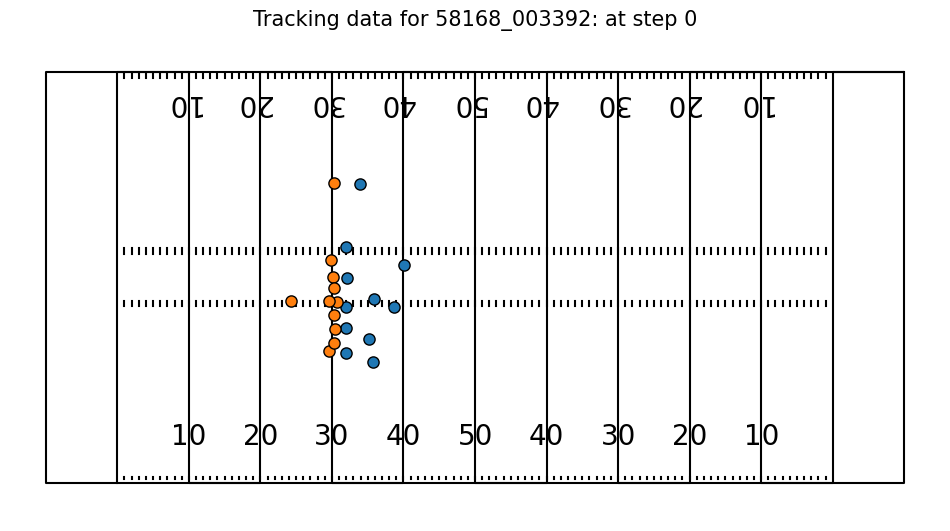

In [57]:
game_play = "58168_003392"
example_tracks = tr_tracking.query("game_play == @game_play and step == 0")
ax = create_football_field()
for team, d in example_tracks.groupby("team"):
    ax.scatter(
        d["x_position"],
        d["y_position"],
        label=team,
        s=65,
        lw=1,
        edgecolors="black",
        zorder=5,
    )
ax.legend().remove()
ax.set_title(f"Tracking data for {game_play}: at step 0", fontsize=15)
plt.show()


In [58]:
tr_tracking.head()

,game_play,game_key,play_id,nfl_player_id,datetime,step,team,position,jersey_number,x_position,y_position,speed,distance,direction,orientation,acceleration,sa
0,58580_001136,58580,1136,44830,2021-10-10 21:08:20.900000+00:00,-108,away,CB,22,61.59,42.60,1.11,0.11,320.33,263.93,0.71,-0.64
1,58580_001136,58580,1136,47800,2021-10-10 21:08:20.900000+00:00,-108,away,DE,97,59.48,26.81,0.23,0.01,346.84,247.16,1.29,0.90
2,58580_001136,58580,1136,52444,2021-10-10 21:08:20.900000+00:00,-108,away,FS,29,72.19,31.46,0.61,0.06,11.77,247.69,0.63,-0.33
3,58580_001136,58580,1136,46206,2021-10-10 21:08:20.900000+00:00,-108,home,TE,86,57.37,22.12,0.37,0.04,127.85,63.63,0.69,0.62
4,58580_001136,58580,1136,52663,2021-10-10 21:08:20.900000+00:00,-108,away,ILB,48,63.25,27.50,0.51,0.05,183.62,253.71,0.31,0.31


# Video Metadata

These files provide information that can be used to sync the video files with the NGS tracking data.

In [59]:
tr_video_metadata.head()

,game_play,game_key,play_id,view,start_time,end_time,snap_time
0,58168_003392,58168,3392,Endzone,2020-09-11 03:01:43.134000+00:00,2020-09-11 03:01:54.971000+00:00,2020-09-11 03:01:48.134000+00:00
1,58168_003392,58168,3392,Sideline,2020-09-11 03:01:43.134000+00:00,2020-09-11 03:01:54.971000+00:00,2020-09-11 03:01:48.134000+00:00
2,58172_003247,58172,3247,Endzone,2020-09-13 19:30:42.414000+00:00,2020-09-13 19:31:00.524000+00:00,2020-09-13 19:30:47.414000+00:00
3,58172_003247,58172,3247,Sideline,2020-09-13 19:30:42.414000+00:00,2020-09-13 19:31:00.524000+00:00,2020-09-13 19:30:47.414000+00:00
4,58173_003606,58173,3606,Endzone,2020-09-13 19:45:07.527000+00:00,2020-09-13 19:45:26.438000+00:00,2020-09-13 19:45:12.527000+00:00


# Contact Labels

Contact labels identify moments when two players are in contact or in contact with the ground. Some things to note about the labels:
- Labels are provided at 10Hz, synchronized with the NGS tracking data.
- Labels start at step == 0 (play start), and end at the step associated with the shortest video (Sideline or Endzone)
- Labels (and submissions) will have a single row for each:
    - Player pair combination where nfl_player_id_1 < nfl_player_id_2
    - Player to ground where nfl_player_id == "G"
- The `contact_id` column is a unique identifier. It is a combination of the `game_play`, `step`, `nfl_player_id_1` and `nfl_player_id_2` columns.
- The `contact` column is a binary value where 0 indicates no-contact and 1 indicates contact.

Even though the labels and video are sampled at different rates, we can approximately join them so that we can visualize them with the video. Below we've provided an example function for joining.


In [60]:
labels.head()

,contact_id,game_play,datetime,step,nfl_player_id_1,nfl_player_id_2,contact
0,58168_003392_0_38590_43854,58168_003392,2020-09-11 03:01:48.100000+00:00,0,38590,43854,0
1,58168_003392_0_38590_41257,58168_003392,2020-09-11 03:01:48.100000+00:00,0,38590,41257,0
2,58168_003392_0_38590_41944,58168_003392,2020-09-11 03:01:48.100000+00:00,0,38590,41944,0
3,58168_003392_0_38590_42386,58168_003392,2020-09-11 03:01:48.100000+00:00,0,38590,42386,0
4,58168_003392_0_38590_47944,58168_003392,2020-09-11 03:01:48.100000+00:00,0,38590,47944,0


In [61]:
def join_helmets_contact(game_play, labels, helmets, meta, view="Sideline", fps=59.94):
    """
    Joins helmets and labels for a given game_play. Results can be used for visualizing labels.
    Returns a dataframe with the joint dataframe, duplicating rows if multiple contacts occur.
    """
    gp_labs = labels.query("game_play == @game_play").copy()
    gp_helms = helmets.query("game_play == @game_play").copy()

    start_time = meta.query("game_play == @game_play and view == @view")[
        "start_time"
    ].values[0]

    gp_helms["datetime"] = (
        pd.to_timedelta(gp_helms["frame"] * (1 / fps), unit="s") + start_time
    )
    gp_helms["datetime"] = pd.to_datetime(gp_helms["datetime"], utc=True)
    gp_helms["datetime_ngs"] = (
        pd.DatetimeIndex(gp_helms["datetime"] + pd.to_timedelta(50, "ms"))
        .floor("100ms")
        .values
    )
    gp_helms["datetime_ngs"] = pd.to_datetime(gp_helms["datetime_ngs"], utc=True)

    gp_labs["datetime_ngs"] = pd.to_datetime(gp_labs["datetime"], utc=True)

    gp = gp_helms.merge(
        gp_labs.query("contact == 1")[
            ["datetime_ngs", "nfl_player_id_1", "nfl_player_id_2", "contact_id"]
        ],
        left_on=["datetime_ngs", "nfl_player_id"],
        right_on=["datetime_ngs", "nfl_player_id_1"],
        how="left",
    )
    return gp


In [67]:
import os
import cv2
import subprocess
from IPython.display import Video, display
import pandas as pd
import time


def video_with_contact(
    video_path: str, baseline_boxes: pd.DataFrame, verbose=True
) -> str:
    """
    Annotates a video with baseline model boxes.
    Helmet boxes are colored based on the contact label.
    """
    VIDEO_CODEC = "mp4v"
    HELMET_COLOR = (0, 0, 0)  # Black
    video_name = os.path.basename(video_path)
    if verbose:
        print(f"Running for {video_name}")
    baseline_boxes = baseline_boxes.copy()

    vidcap = cv2.VideoCapture(video_path)
    fps = vidcap.get(cv2.CAP_PROP_FPS)
    width = int(vidcap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(vidcap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    output_path = "./train/labeled_" + video_name
    tmp_output_path = "./train/tmp_" + video_name
    output_video = cv2.VideoWriter(
        tmp_output_path, cv2.VideoWriter_fourcc(*VIDEO_CODEC), fps, (width, height)
    )
    frame = 0
    while True:
        it_worked, img = vidcap.read()
        if not it_worked:
            break
        # We need to add 1 to the frame count to match the label frame index
        # that starts at 1
        frame += 1

        # Let's add a frame index to the video so we can track where we are
        img_name = video_name.replace('.mp4','')
        cv2.putText(
            img,
            img_name,
            (10, 30),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            HELMET_COLOR,
            thickness=1,
        )
        
        cv2.putText(
            img,
            str(frame),
            (1280 - 90, 720 - 20),
            cv2.FONT_HERSHEY_SIMPLEX,
            1,
            HELMET_COLOR,
            thickness=1,
        )

        # Now, add the boxes
        boxes = baseline_boxes.query("video == @video_name and frame == @frame")
        contact_players = boxes.dropna(subset=["nfl_player_id_2"]).query(
            'nfl_player_id_2 != "G"'
        )
        contact_ids = (
            contact_players["nfl_player_id_1"].astype("int").values.tolist()
            + contact_players["nfl_player_id_2"].astype("int").values.tolist()
        )
        for box in boxes.itertuples(index=False):

            if box.nfl_player_id_2 == "G":
                box_color = (0, 0, 255)  # Red
                box_thickness = 2
            elif int(box.nfl_player_id) in contact_ids:
                box_color = (0, 255, 0)  # green
                box_thickness = 2

                # Add line between players in contact
                if not np.isnan(float(box.nfl_player_id_2)):
                    player2 = int(box.nfl_player_id_2)
                    player2_row = boxes.query("nfl_player_id == @player2")
                    if len(player2_row) == 0:
                        # Player 2 is not in view
                        continue
                    cv2.line(
                        img,
                        (box.left + int(box.width / 2), box.top + int(box.height / 2)),
                        (
                            player2_row.left.values[0]
                            + int(player2_row.width.values[0] / 2),
                            player2_row.top.values[0]
                            + int(player2_row.height.values[0] / 2),
                        ),
                        color=(255, 0, 0),
                        thickness=2,
                    )

            else:
                box_color = HELMET_COLOR
                box_thickness = 1

            # Draw lines between two boxes

            cv2.rectangle(
                img,
                (box.left, box.top),
                (box.left + box.width, box.top + box.height),
                box_color,
                thickness=box_thickness,
            )
            cv2.putText(
                img,
                box.player_label,
                (box.left + 1, max(0, box.top - 20)),
                cv2.FONT_HERSHEY_SIMPLEX,
                0.5,
                HELMET_COLOR,
                thickness=1,
            )

        output_video.write(img)
    output_video.release()
    
    time.sleep(2)
    # Not all browsers support the codec, we will re-load the file at tmp_output_path
    # and convert to a codec that is more broadly readable using ffmpeg
    if os.path.exists(output_path):
        os.remove(output_path)
    p = subprocess.run(
        [
            "ffmpeg",
            "-i",
            tmp_output_path,
            "-crf",
            "18",
            "-preset",
            "veryfast",
            "-hide_banner",
            "-loglevel",
            "error",
            "-vcodec",
            "libx264",
            output_path,
        ]
    )
    
    os.remove(tmp_output_path)

    return output_path


## Example Video with Labels

In this video you can see the labels for this play, approximately linked with the associated helmets within the video.

Note in this video:
- **Black** helmet boxes indicate that player is not in contact. A unique number (home/visiting combined with jersey number) is shown next to their helmet.
- **Green** helmet box indicates the player is in contact with one or more players.
- **Red** helmet box indicates the player is in contact with the ground (and possibly another player).
- **Blue** lines show the link between players in contact with each other.

In [68]:
game_play = "58168_003392"
gp = join_helmets_contact(game_play, labels, tr_helmets, tr_video_metadata)

example_video = f"./train/{game_play}_Sideline.mp4"
output_video = video_with_contact(example_video, gp)

frac = 0.65  # scaling factor for display
display(
    Video(data=output_video, embed=True, height=int(720 * frac), width=int(1280 * frac))
)


Running for 58168_003392_Sideline.mp4
CompletedProcess(args=['ffmpeg', '-i', './train/tmp_58168_003392_Sideline.mp4', '-crf', '18', '-preset', 'veryfast', '-hide_banner', '-loglevel', 'error', '-vcodec', 'libx264', './train/labeled_58168_003392_Sideline.mp4'], returncode=0)


# Sample Submission

A **sample_submission.csv** file is provided. When your notebook is being processed on the test set this file will include every row required for a valid submission.

Note the `contact_id` column is a unique identifier consisting of a combination of `game_play`, `step`, `nfl_player_id_1` and `nfl_player_id_2`

In [12]:
ss = pd.read_csv(f'{BASE_DIR}/sample_submission.csv')
ss.head()

,contact_id,contact
0,58168_003392_0_38590_43854,0
1,58168_003392_0_38590_41257,0
2,58168_003392_0_38590_41944,0
3,58168_003392_0_38590_42386,0
4,58168_003392_0_38590_47944,0


# Baseline Approach

We can create a simple solution using only the tracking data and identifying an optimal threshold based on the training data for the competition metric.

This baseline submission does not consider player to ground contact, and predicts every player-to-ground row as non-contact.

The process is simple:
- For each `contact_id` we compute the seperation distance between players.
- We fill player-to-ground rows with a distance of 99 so they are treated as non-contact.
- We loop through thresholds between 0 and 5 yards and compute the competition metric at each threshold.
- We use the threshold that produces the best score when applying this to our test submission.

In [69]:
def compute_distance(df, tr_tracking, merge_col="datetime"):
    """
    Merges tracking data on player1 and 2 and computes the distance.
    """
    df_combo = (
        df.astype({"nfl_player_id_1": "str"})
        .merge(
            tr_tracking.astype({"nfl_player_id": "str"})[
                ["game_play", merge_col, "nfl_player_id", "x_position", "y_position"]
            ],
            left_on=["game_play", merge_col, "nfl_player_id_1"],
            right_on=["game_play", merge_col, "nfl_player_id"],
            how="left",
        )
        .rename(columns={"x_position": "x_position_1", "y_position": "y_position_1"})
        .drop("nfl_player_id", axis=1)
        .merge(
            tr_tracking.astype({"nfl_player_id": "str"})[
                ["game_play", merge_col, "nfl_player_id", "x_position", "y_position"]
            ],
            left_on=["game_play", merge_col, "nfl_player_id_2"],
            right_on=["game_play", merge_col, "nfl_player_id"],
            how="left",
        )
        .drop("nfl_player_id", axis=1)
        .rename(columns={"x_position": "x_position_2", "y_position": "y_position_2"})
        .copy()
    )

    df_combo["distance"] = np.sqrt(
        np.square(df_combo["x_position_1"] - df_combo["x_position_2"])
        + np.square(df_combo["y_position_1"] - df_combo["y_position_2"])
    )
    return df_combo


def add_contact_id(df):
    # Create contact ids
    df["contact_id"] = (
        df["game_play"]
        + "_"
        + df["step"].astype("str")
        + "_"
        + df["nfl_player_id_1"].astype("str")
        + "_"
        + df["nfl_player_id_2"].astype("str")
    )
    return df


def expand_contact_id(df):
    """
    Splits out contact_id into seperate columns.
    """
    df["game_play"] = df["contact_id"].str[:12]
    df["step"] = df["contact_id"].str.split("_").str[-3].astype("int")
    df["nfl_player_id_1"] = df["contact_id"].str.split("_").str[-2]
    df["nfl_player_id_2"] = df["contact_id"].str.split("_").str[-1]
    return df


In [70]:
df_combo = compute_distance(labels, tr_tracking)

print(df_combo.shape, labels.shape)

df_dist = df_combo.merge(
    tr_tracking[["game_play", "datetime", "step"]].drop_duplicates()
)
df_dist["distance"] = df_dist["distance"].fillna(99)  # Fill player to ground with 99


(4721618, 12) (4721618, 7)


Note our dataframe now includes `distance`.

In [71]:
df_dist.head()

,contact_id,game_play,datetime,step,nfl_player_id_1,nfl_player_id_2,contact,x_position_1,y_position_1,x_position_2,y_position_2,distance
0,58168_003392_0_38590_43854,58168_003392,2020-09-11 03:01:48.100000+00:00,0,38590,43854,0,40.33,25.28,41.99,16.79,8.650763
1,58168_003392_0_38590_41257,58168_003392,2020-09-11 03:01:48.100000+00:00,0,38590,41257,0,40.33,25.28,45.77,15.59,11.112592
2,58168_003392_0_38590_41944,58168_003392,2020-09-11 03:01:48.100000+00:00,0,38590,41944,0,40.33,25.28,42.00,22.85,2.948525
3,58168_003392_0_38590_42386,58168_003392,2020-09-11 03:01:48.100000+00:00,0,38590,42386,0,40.33,25.28,45.87,23.89,5.711716
4,58168_003392_0_38590_47944,58168_003392,2020-09-11 03:01:48.100000+00:00,0,38590,47944,0,40.33,25.28,42.10,26.58,2.196110


In [72]:
for dist in range(0, 5):
    score = matthews_corrcoef(df_dist["contact"], df_dist["distance"] <= dist)
    print(f"Threshold Distance: {dist} Yard - MCC Score: {score:0.4f}")


Threshold Distance: 0 Yard - MCC Score: 0.0000
Threshold Distance: 1 Yard - MCC Score: 0.5201
Threshold Distance: 2 Yard - MCC Score: 0.3592
Threshold Distance: 3 Yard - MCC Score: 0.2517
Threshold Distance: 4 Yard - MCC Score: 0.1935


# Create Baseline Submission

Seeing above that the optimal threshold is 1 yard. We can now compute the distances on the test set and submit with the threshold of 1 yard.

*Note: This is a code competition. When you submit, your model will be rerun on a set of 61 unseen plays located in a holdout test set. The publicly provided test videos are simply a set of mock plays (copied from the training set) which are not used in scoring.*

In [73]:
ss = pd.read_csv(f"{BASE_DIR}/sample_submission.csv")

THRES = 1

ss = expand_contact_id(ss)
ss_dist = compute_distance(ss, te_tracking, merge_col="step")

print(ss_dist.shape, ss.shape)

submission = ss_dist[["contact_id", "distance"]].copy()
submission["contact"] = (submission["distance"] <= THRES).astype("int")
submission = submission.drop('distance', axis=1)
submission[["contact_id", "contact"]].to_csv("submission.csv", index=False)

submission.head()

(49588, 11) (49588, 6)


,contact_id,contact
0,58168_003392_0_38590_43854,0
1,58168_003392_0_38590_41257,0
2,58168_003392_0_38590_41944,0
3,58168_003392_0_38590_42386,0
4,58168_003392_0_38590_47944,0
